...................................................

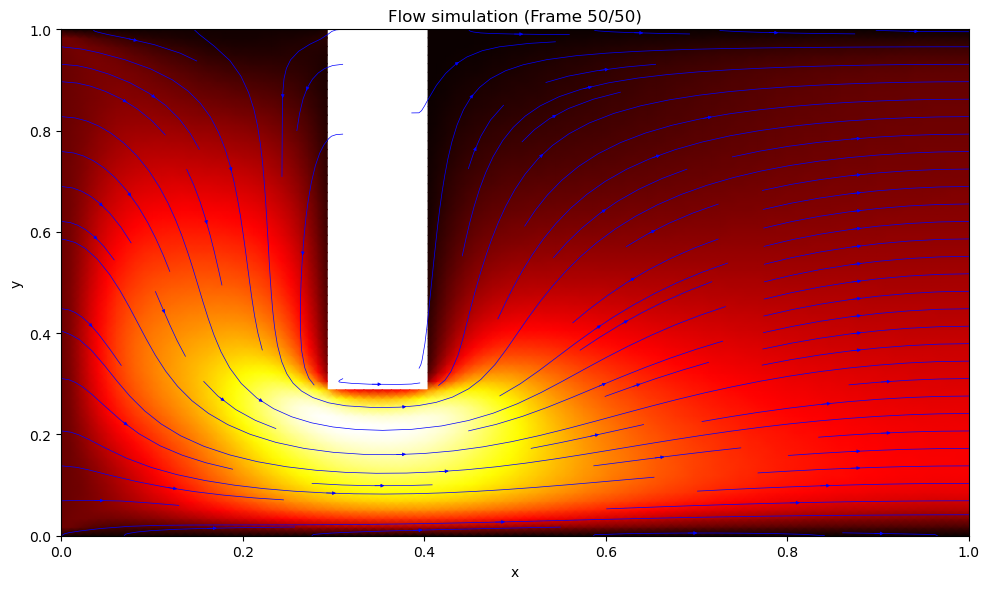

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.colors as colors

# stability condition for advection: dt <= min(dx, dy) / max_velocity
# stability condition for diiffusion: dt <= (dx^2 * dy^2) / (2 * nu * (dx^2 + dy^2)))

# Constants and parameters
length_x, length_y = 1.0, 1.0                       # space size
nx, ny = 100, 60                                    # grid size
dx, dy = length_x / nx, length_y / ny               # cell size
dt = 0.00005                                        # time step
nu = 0.5                                            # kinematic viscosity
div_tolerance = 1e-3                                # divergence tolerance
beta0 = 1                                           # relaxation factor
max_iterations = 50                                 # max pressure iterations per time step
total_time = 0.005                                   # total simulation time
beta = beta0 / (2 * dt * (1 / dx**2 + 1 / dy**2))   # pressure update coefficient

# Initialize velocity fields and pressure
u = np.zeros((ny, nx + 1), dtype=np.float32)                         # x-velocity on cell faces
v = np.zeros((ny + 1, nx), dtype=np.float32)                         # y-velocity on cell faces
p = np.zeros((ny, nx), dtype=np.float32)                             # pressure at cell centers
div = np.zeros((ny, nx), dtype=np.float32)

# Define obstacle: rectangular block in the middle
obstacle_x = slice(int(nx * 0.3), int(nx * 0.4))
obstacle_y = slice(int(ny * 0.3), int(ny * 1))

# Create a mask for the obstacle (1 for fluid cells, 0 for obstacle cells)
mask = np.ones((ny, nx))
mask[obstacle_y, obstacle_x] = 0

# Initialize flow: add inlet velocity from the left
u[:, 0] = 1.0

# Function to compute the divergence in each cell
def compute_divergence(u, v):
    for j in range(ny):
        for i in range(nx):
            div[j, i] = (u[j, i+1] - u[j, i]) / dx + (v[j+1, i] - v[j, i]) / dy

# Function to update velocities based on Navier-Stokes equation
def update_velocities():
    global u, v
    
    # Create temporary arrays to store intermediate velocities
    u_next = u.copy()
    v_next = v.copy()
    
    # Internal cells (excluding boundaries and obstacle)
    for j in range(1, ny-1):
        for i in range(1, nx):
            # Calculate averages for u at cell centers
            u_i__j = 0.5 * (u[j, i-1] + u[j, i])
            u_i_plus1__j = 0.5 * (u[j, i] + u[j, i+1])
            
            # Calculate uv product terms (Eq. uv-average)s
            uv_i_plushalf__j_minushalf = 0.25 * (u[j-1, i] + u[j, i]) * (v[j, i-1] + v[j, i])
            uv_i_plushalf__j_plushalf = 0.25 * (u[j, i] + u[j+1, i]) * (v[j+1, i-1] + v[j+1, i])
            
            # Implement u-momentum equation (Eq. u-finite-diff)
            u_next[j, i] = u[j, i] + dt * (
                + (u_i__j**2 - u_i_plus1__j**2) / dx
                + (uv_i_plushalf__j_minushalf - uv_i_plushalf__j_plushalf) / dy
                + (p[j, i-1] - p[j, i]) / dx
                + nu * (
                    (u[j, i+1] - 2*u[j, i] + u[j, i-1]) / (dx**2)
                    + (u[j+1, i] - 2*u[j, i] + u[j-1, i]) / (dy**2)
                )
            )
    
    for j in range(1, ny):
        for i in range(1, nx-1):            
            # Calculate averages for v at cell centers
            v_i__j = 0.5 * (v[j-1, i] + v[j, i])
            v_i__j_plus1 = 0.5 * (v[j, i] + v[j+1, i])
            
            # Calculate uv product terms (Eq. uv-average)
            uv_i_minushalf__j_plushalf = 0.25 * (u[j-1, i] + u[j, i]) * (v[j, i-1] + v[j, i])
            uv_i_plushalf__j_plushalf = 0.25 * (u[j-1, i+1] + u[j, i+1]) * (v[j, i] + v[j, i+1])
            
            # Implement v-momentum equation (Eq. v-finite-diff)
            v_next[j, i] = v[j, i] + dt * (
                + (v_i__j**2 - v_i__j_plus1**2) / dy
                + (uv_i_minushalf__j_plushalf - uv_i_plushalf__j_plushalf) / dx
                + (p[j-1, i] - p[j, i]) / dy
                + nu * (
                    (v[j, i+1] - 2*v[j, i] + v[j, i-1]) / (dx**2)
                    + (v[j+1, i] - 2*v[j, i] + v[j-1, i]) / (dy**2)
                )
            )
    
    # Update the velocity fields
    u = u_next.copy()
    v = v_next.copy()
    
    # Apply boundary conditions
    apply_boundary_conditions()

# Function to perform pressure correction iterations
def pressure_correction():
    global u, v, p
    
    for _ in range(max_iterations):
        # Compute divergence
        compute_divergence(u, v)
        
        done = True
        # Update pressure and velocity components for cells with high divergence
        for j in range(ny):
            for i in range(nx):
                if mask[j, i] == 1 and abs(div[j, i]) > div_tolerance:
                    done = False

                    delta_p = -beta * div[j, i]
                    # Update pressure w/ pressure gradient damping
                    p[j, i] += delta_p * 0.7

                    # Adjust velocity components (Eqs. u-update1, u-update2, v-update1, v-update2)
                    u[j, i+1] += 0.5 * dt/dx * delta_p
                    u[j, i] -= 0.5 * dt/dx * delta_p
                    v[j+1, i] += 0.5 * dt/dy * delta_p
                    v[j, i] -= 0.5 * dt/dy * delta_p
        
        if done:
            return
        
    # print('\nWarning: convergence not reached, max_div =', np.max(np.abs(div)))

# Function to apply boundary conditions
def apply_boundary_conditions():
    global u, v
    
    # Left boundary (inlet): constant velocity
    u[:, 0] = 1.0
    
    # Right boundary (outlet): zero gradient
    u[:, -1] = u[:, -2]
    
    # Top and bottom boundaries: no-slip condition
    v[0, :] = 0.0
    v[-1, :] = 0.0
    u[0, :] = 0.0
    u[-1, :] = 0.0
    
    # Obstacle boundary conditions: no-slip condition
    for j in range(ny):
        for i in range(nx):
            if mask[j, i] == 0:
                u[j, i] = 0.0       # Left face
                u[j, i+1] = 0.0     # Right face
                v[j, i] = 0.0       # Bottom face
                v[j+1, i] = 0.0     # Top face

# Function to run the simulation for one time step
def simulation_step():
    # Update velocities using Navier-Stokes equations
    update_velocities()
    # Perform pressure correction to enforce incompressibility
    pressure_correction()

# Function to calculate the magnitude of velocity at cell centers
def calculate_velocity_magnitude():
    u_center = 0.5 * (u[:, :-1] + u[:, 1:])
    v_center = 0.5 * (v[:-1, :] + v[1:, :])
    magnitude = np.sqrt(u_center**2 + v_center**2)
    return magnitude

# Function to visualize the flow
def visualize_flow(velocity_magnitude, streamplot=True):
    plt.figure(figsize=(12, 8))
    
    # Create a mask for plotting the obstacle
    plot_mask = mask.copy()
    plot_mask[plot_mask == 0] = np.nan
    
    # Create a meshgrid for plotting
    x = np.linspace(0, length_x, nx)
    y = np.linspace(0, length_y, ny)
    X, Y = np.meshgrid(x, y)
    
    # Plot velocity magnitude
    plt.pcolormesh(X, Y, velocity_magnitude * plot_mask, cmap='hot', shading='gouraud')
    plt.colorbar(label='Velocity')
    
    # Plot the obstacle
    # plt.fill_between([x[obstacle_x.start], x[obstacle_x.stop-1]], 
    #                  y[obstacle_y.start], y[obstacle_y.stop-1], 
    #                  color='black')
    
    # Calculate velocities at cell centers for streamplot
    if streamplot:
        u_center = 0.5 * (u[:, :-1] + u[:, 1:])
        v_center = 0.5 * (v[:-1, :] + v[1:, :])
        
        # Use a sparser grid for the streamplot to avoid clutter
        stride = 2
        plt.streamplot(X[::stride, ::stride], Y[::stride, ::stride], 
                       u_center[::stride, ::stride], v_center[::stride, ::stride], 
                       color='blue', density=1.5, linewidth=1, arrowsize=1)
    
    plt.title('Flow simulation')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.tight_layout()
    plt.show()

# Run the simulation
def run_simulation():
    # Initialize variables
    time = 0.0
    steps = int(total_time / dt)
    
    print(f"Running simulation for {steps} steps...")
    
    # Main simulation loop
    for step in range(steps):
        simulation_step()
        time += dt
        
        if step % 10 == 0:
            print(f"Step {step}/{steps}, Time: {time:.5f}")
    
    print("Simulation completed!")
    
    # Visualize final state
    velocity_magnitude = calculate_velocity_magnitude()
    visualize_flow(velocity_magnitude)
    
    return velocity_magnitude

# Run the simulation
# if __name__ == "__main__":
# velocity_magnitude = run_simulation()

# Animation function (optional)
def create_animation(frames=50):
    global u, v, p
    
    # Reset variables
    u = np.zeros((ny, nx + 1))
    v = np.zeros((ny + 1, nx))
    p = np.zeros((ny, nx))
    u[:, 0] = 1.0  # Reset inlet condition
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Function to update each frame
    def update(frame):
        ax.clear()
        
        # Run multiple steps per frame
        steps_per_frame = max(1, int(total_time / dt / frames))
        for _ in range(steps_per_frame):
            simulation_step()
        
        # Calculate velocity magnitude
        velocity_magnitude = calculate_velocity_magnitude()
        
        # Create a masked version for plotting
        masked_magnitude = np.ma.masked_array(velocity_magnitude, mask=1-mask)
        
        # Create a meshgrid for plotting
        x = np.linspace(0, length_x, nx)
        y = np.linspace(0, length_y, ny)
        X, Y = np.meshgrid(x, y)
        
        # Plot velocity magnitude
        contour = ax.pcolormesh(X, Y, masked_magnitude, cmap='hot', shading='gouraud')
        
        # Plot the obstacle
        # ax.fill_between([x[obstacle_x.start], x[obstacle_x.stop-1]], 
        #                  y[obstacle_y.start], y[obstacle_y.stop-1], 
        #                  color='black')
        
        # Calculate velocities at cell centers for streamplot
        u_center = 0.5 * (u[:, :-1] + u[:, 1:])
        v_center = 0.5 * (v[:-1, :] + v[1:, :])
        
        # Use a sparser grid for the streamplot to avoid clutter
        stride = 1
        ax.streamplot(X[::stride, ::stride], Y[::stride, ::stride], 
                      u_center[::stride, ::stride], v_center[::stride, ::stride], 
                      color='blue', density=1, linewidth=0.5, arrowsize=0.5)
        
        ax.set_title(f'Flow simulation (Frame {frame+1}/{frames})')
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        plt.tight_layout()

        print('.', end='')
        
        return contour,
    
    # Create the animation
    anim = FuncAnimation(fig, update, frames=frames, interval=200, blit=False)
    
    return anim

# Uncomment to create animation
num_frames = min(50, int(total_time / dt))
anim = create_animation(frames=num_frames)
anim = HTML(anim.to_jshtml())

In [2]:
anim